In [1]:
import pandas as pd
import numpy as np

import seaborn as sns 
import matplotlib.pyplot as plt

import warnings 
warnings.filterwarnings('ignore')

## Reading and Understanding the Data

In [2]:
#import the data
df = pd.read_csv('train.csv')

In [3]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
# Check shape of dataframe
df.shape

(1460, 81)

In [5]:
#checking information 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [6]:
#describe the dataframe
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


## Data Cleaning & Missing Value imputation

In [8]:
pd.set_option('display.max_rows', 2000)
#Count of missing values
df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [9]:
pd.set_option('display.max_rows', None)
#percentage of missing values
round(df.isnull().sum()/len(df.index), 2)*100

Id                 0.0
MSSubClass         0.0
MSZoning           0.0
LotFrontage       18.0
LotArea            0.0
Street             0.0
Alley             94.0
LotShape           0.0
LandContour        0.0
Utilities          0.0
LotConfig          0.0
LandSlope          0.0
Neighborhood       0.0
Condition1         0.0
Condition2         0.0
BldgType           0.0
HouseStyle         0.0
OverallQual        0.0
OverallCond        0.0
YearBuilt          0.0
YearRemodAdd       0.0
RoofStyle          0.0
RoofMatl           0.0
Exterior1st        0.0
Exterior2nd        0.0
MasVnrType         1.0
MasVnrArea         1.0
ExterQual          0.0
ExterCond          0.0
Foundation         0.0
BsmtQual           3.0
BsmtCond           3.0
BsmtExposure       3.0
BsmtFinType1       3.0
BsmtFinSF1         0.0
BsmtFinType2       3.0
BsmtFinSF2         0.0
BsmtUnfSF          0.0
TotalBsmtSF        0.0
Heating            0.0
HeatingQC          0.0
CentralAir         0.0
Electrical         0.0
1stFlrSF   

#### Below Features have mising values, We will impute it as per DataDictionary and Data understanding.
- Alley
- FireplaceQu
- PoolQC
- Fence
- LotFrontage
- MiscFeature
- Electrical
-  Basement featues [BsmtQual, BsmtCond,  BsmtExposure,  BsmtFinType2, BsmtFinType1 ]
- MasVnrType  MasVnrArea   
- Garage features [ GarageType GarageYrBlt GarageFinish GarageQual GarageCond ] 


In [10]:
#Imputing missing values of Alley with No_alley_access as per data dictonary.
df.Alley.fillna('No_alley_access',inplace=True)

In [11]:
#Imputing missing values of FireplaceQu with NoFireplace as per data dictonary.
df.FireplaceQu.fillna('NoFireplace',inplace=True)

In [12]:
#Imputing missing values with No_Pool as per data dictonary.
df.PoolQC.fillna('No_Pool',inplace=True)

In [13]:
#Imputing missing values with No_Fence as per data dictonary.
df.Fence.fillna('No_Fence',inplace=True)

In [14]:
#Imputing missing values of basement features  with No_basement as per data dictonary. 
#As they have same number of missing values.

df.BsmtQual.fillna('No_Basement',inplace=True)

df.BsmtCond.fillna('No_Basement',inplace=True)

df.BsmtExposure.fillna('No_Basement',inplace=True)

df.BsmtFinType2.fillna('No_Basement',inplace=True)

df.BsmtFinType1.fillna('No_Basement',inplace=True)

In [15]:
#Checking values for MasVnrType
df.MasVnrType.value_counts()

None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

In [16]:
#Imputing missing values of MasVnrType with None as per data understanding  and mode .
df.MasVnrType.fillna('None',inplace=True)

In [17]:
#Imputing missing values with median, means middle value
df['MasVnrArea'].fillna(df['MasVnrArea'].median(),inplace=True)

In [9]:
#Dropping attributes having more than 30 % missing values
#df.drop(['Alley','FireplaceQu','PoolQC','Fence','MiscFeature'],inplace=True, axis=1)                               

In [18]:
#Checking vlues for LotFrontage column
df['LotFrontage'].value_counts()

60.0     143
70.0      70
80.0      69
50.0      57
75.0      53
65.0      44
85.0      40
78.0      25
21.0      23
90.0      23
68.0      19
64.0      19
24.0      19
73.0      18
55.0      17
63.0      17
79.0      17
72.0      17
100.0     16
66.0      15
74.0      15
51.0      15
52.0      14
59.0      13
82.0      12
71.0      12
67.0      12
43.0      12
40.0      12
57.0      12
76.0      11
69.0      11
92.0      10
34.0      10
53.0      10
86.0      10
88.0      10
84.0       9
35.0       9
62.0       9
44.0       9
77.0       9
93.0       8
98.0       8
96.0       8
61.0       8
95.0       7
58.0       7
120.0      7
107.0      7
94.0       6
81.0       6
36.0       6
30.0       6
48.0       6
91.0       6
41.0       6
54.0       6
89.0       6
110.0      6
105.0      6
32.0       5
47.0       5
87.0       5
56.0       5
37.0       5
83.0       5
102.0      4
42.0       4
49.0       4
104.0      3
103.0      3
99.0       3
45.0       3
108.0      3
130.0      3
124.0      2

In [19]:
#Imputing missing values with median, means middle value
df['LotFrontage'].fillna(df['LotFrontage'].median(),inplace=True)

In [20]:
#Checking values for MasVnrType
df.MiscFeature.value_counts()

Shed    49
Gar2     2
Othr     2
TenC     1
Name: MiscFeature, dtype: int64

In [21]:
#Imputing missing values of MiscFeature with None as per DataDictionary
df.MiscFeature.fillna('None',inplace=True)

In [22]:
df.Electrical.value_counts()     

SBrkr    1334
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64

In [23]:
#Imputing missing values with mode, means max occurance
df.Electrical.fillna('SBrkr',inplace=True)

In [24]:
garage_missing_cols = ['GarageType','GarageYrBlt','GarageFinish','GarageQual','GarageCond']

In [25]:
# Get the value counts of all the garage columns having null values

for column in garage_missing_cols:
    
    print(df[column].value_counts())
    print('___________________________________________________')

Attchd     870
Detchd     387
BuiltIn     88
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64
___________________________________________________
2005.0    65
2006.0    59
2004.0    53
2003.0    50
2007.0    49
1977.0    35
1998.0    31
1999.0    30
1976.0    29
2008.0    29
2000.0    27
1968.0    26
2002.0    26
1950.0    24
1993.0    22
1958.0    21
1966.0    21
2009.0    21
1962.0    21
1965.0    21
1970.0    20
1996.0    20
1957.0    20
2001.0    20
1978.0    19
1954.0    19
1960.0    19
1997.0    19
1974.0    18
1964.0    18
1994.0    18
1995.0    18
1959.0    17
1956.0    16
1963.0    16
1990.0    16
1980.0    15
1979.0    15
1969.0    15
1967.0    15
1973.0    14
1988.0    14
1920.0    14
1972.0    14
1940.0    14
1992.0    13
1961.0    13
1971.0    13
1955.0    13
1953.0    12
1948.0    11
1987.0    11
1925.0    10
1985.0    10
1981.0    10
1989.0    10
1941.0    10
1975.0     9
1991.0     9
1939.0     9
1930.0     8
1984.0     8
1949.0     8
1983.0  

In [26]:
# filling missing data with no garage as per data dictonary, as we see number of missing values is same for all

for column in garage_missing_cols:
    
        df[column].fillna('No_Garage',inplace=True)


In [27]:
#Count of missing values
df.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr

#### All missing values has been treated now.

- We have imputed missing values in Basement features with No_Basement similarly with Garage Features. 
- We have imputed missing values with median and mode as per understanding 
- We have inputed missing values with new label as per defination in data dictionary.

In [28]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

### Data Cleaning and Preparation

In [29]:
#Extracting year columns
year_cols = ['YrSold', 'MoSold','YearBuilt','YearRemodAdd']

In [30]:
#Checking vlues for YearRemodAdd column
df.YearRemodAdd.value_counts()

1950    178
2006     97
2007     76
2005     73
2004     62
2000     55
2003     51
2002     48
2008     40
1996     36
1998     36
1995     31
1976     30
1999     30
1970     26
1977     25
1997     25
2009     23
1994     22
2001     21
1972     20
1965     19
1993     19
1959     18
1971     18
1992     17
1968     17
1978     16
1966     15
1958     15
1990     15
1969     14
1954     14
1991     14
1962     14
1963     13
1960     12
1980     12
1967     12
1973     11
1989     11
1964     11
1953     10
1979     10
1987     10
1956     10
1975     10
1955      9
1957      9
1985      9
1988      9
1981      8
1961      8
1984      7
1982      7
1974      7
2010      6
1986      5
1952      5
1983      5
1951      4
Name: YearRemodAdd, dtype: int64

In [31]:
#Checking vlues for YearBuilt column
df.YearBuilt.value_counts()

2006    67
2005    64
2004    54
2007    49
2003    45
1976    33
1977    32
1920    30
1959    26
1998    25
1999    25
1965    24
2000    24
1970    24
1954    24
1958    24
2008    23
2002    23
1972    23
1971    22
1968    22
1950    20
1957    20
2001    20
1994    19
1962    19
1940    18
1966    18
2009    18
1995    18
1910    17
1993    17
1960    17
1963    16
1978    16
1925    16
1955    16
1967    16
1996    15
1941    15
1964    15
1961    14
1948    14
1956    14
1969    14
1997    14
1992    13
1953    12
1990    12
1949    12
1973    11
1988    11
1900    10
1974    10
1915    10
1980    10
1984     9
1926     9
1936     9
1979     9
1930     9
1922     8
1975     8
1939     8
1916     8
1928     7
1914     7
1923     7
1924     7
1918     7
1946     7
1935     6
1951     6
1921     6
1945     6
1982     6
1931     6
1986     5
1937     5
1981     5
1991     5
1947     5
1952     5
1985     5
1929     4
1938     4
1983     4
1932     4
1880     4
1919     3
1989     3

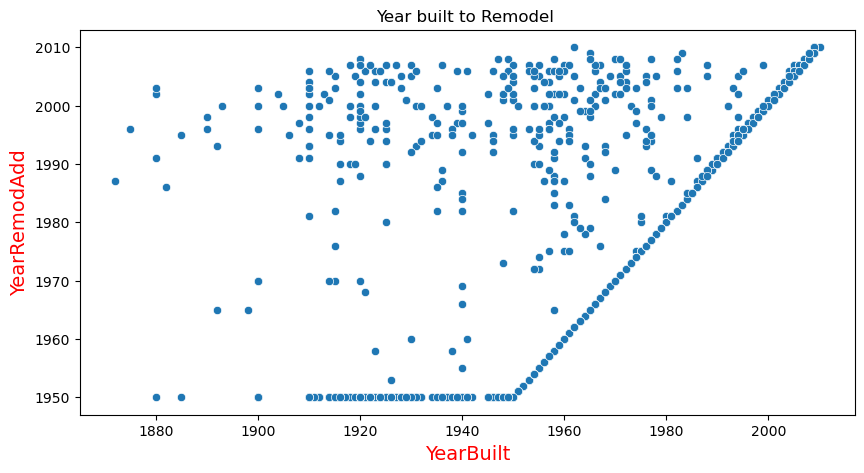

In [32]:
#Checking year built wrt remodeleing year
plt.figure(figsize=(10,5))
sns.scatterplot(data=df, x= 'YearBuilt', y= 'YearRemodAdd')
plt.xlabel('YearBuilt',fontsize=14, color='r' )
plt.ylabel('YearRemodAdd', fontsize=14, color='r' )
plt.xticks(rotation=0)
plt.title('Year built to Remodel ',fontsize=12)
plt.show()

There are four columns which gives us details about the years of the construction. 
Deriving a new column Age of building and dropping the other columns. 
we take the remodel date because if the house is remodel it means they have made it better.
so it would not be right to take original date of built

#### Creating new column AGE as per difference in remodel and sell year

In [33]:

#calculating age
df['Age']=df['YrSold']-df['YearRemodAdd']
df['Age'].head()

0     5
1    31
2     6
3    36
4     8
Name: Age, dtype: int64

In [34]:
#dropping year coulmns
df.drop(['YrSold', 'MoSold','YearBuilt','YearRemodAdd'],axis=1, inplace=True)

In [35]:
df.shape

(1460, 78)

In [36]:
#dropping ID coulmn
df.drop(['Id'],axis=1, inplace=True)

In [37]:
df.shape

(1460, 77)

- We have Created new feature Age WRT YrSold and YearRemodAdd
- We have dropped year coulmns.
- We have dropped ID column

### Data Visualization with Charts (EDA)

In [38]:
#Extracting numerical attributes
numeric_feats = df.dtypes[df.dtypes != "object"].index
numeric_feats

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'SalePrice', 'Age'],
      dtype='object')

In [39]:
#Pair plot for each numerical columns 
sns.pairplot(data = df, vars= numeric_feats)
plt.show()

- We do see some linear relationship of salesprice (target variable) with our independent varaiables OverallQual, OverallCond, TotalBsmtSF, 1stFlrSF, 2ndFlrSF, GrLivArea, TotalRmsAbvGrd, GarageCars, GarageArea. Age  

In [40]:
#setting background style to darkgrid
sns.set_style('darkgrid')

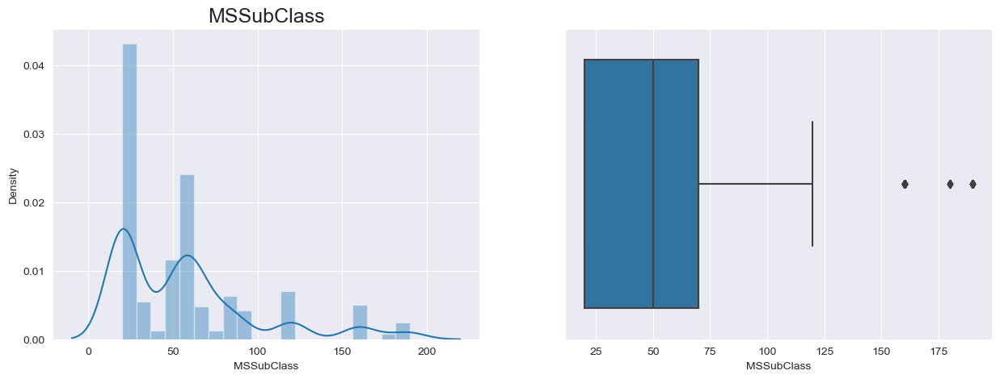

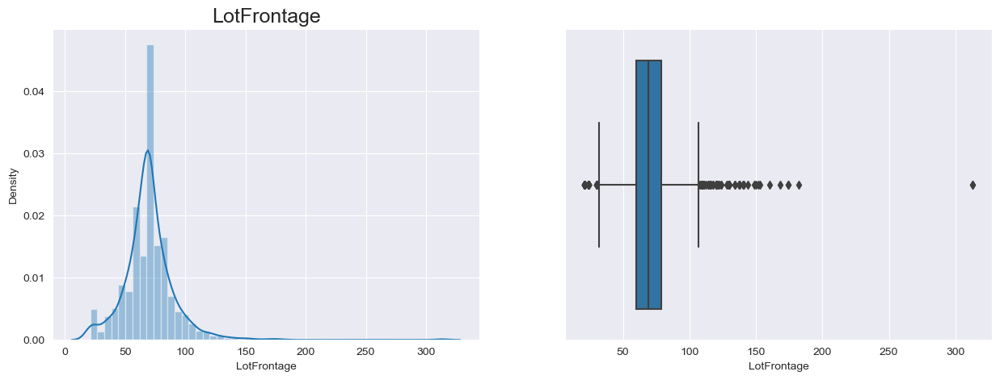

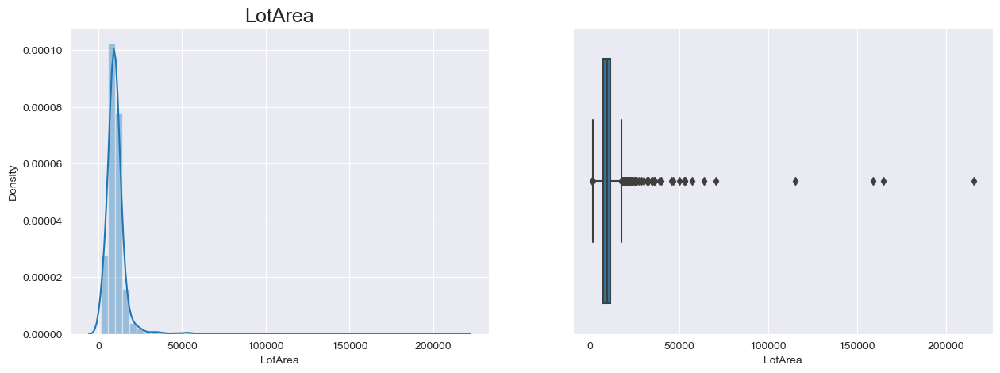

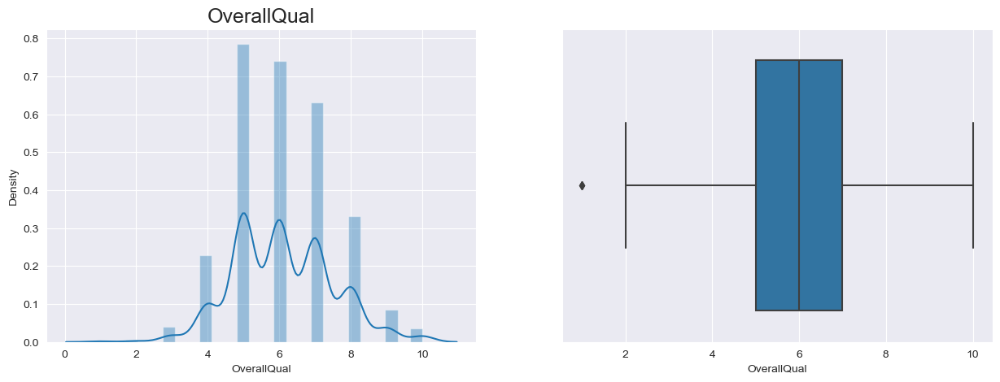

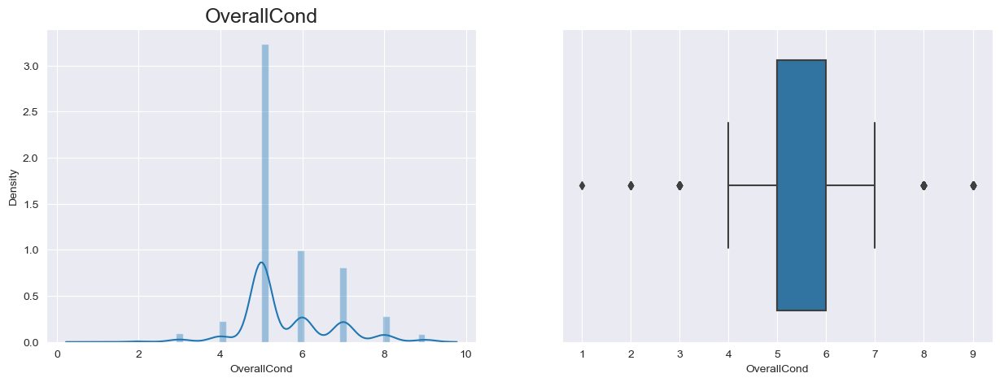

...

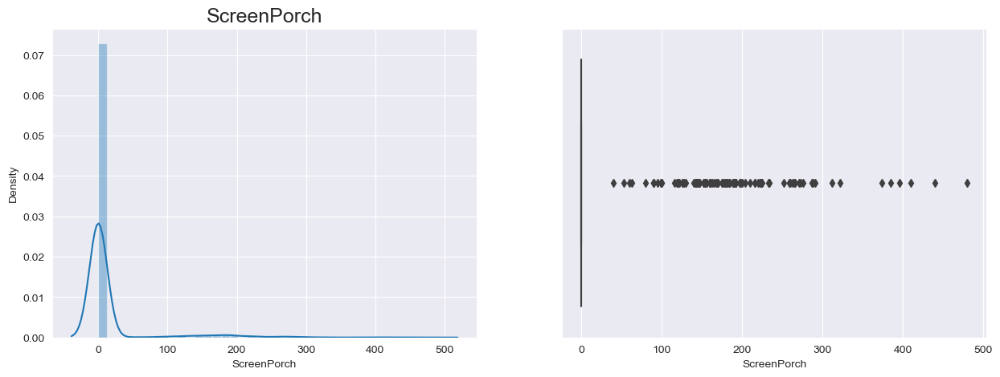

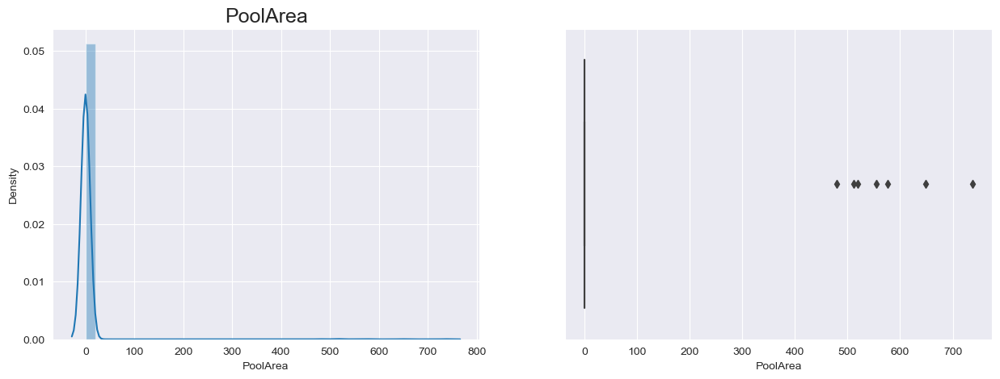

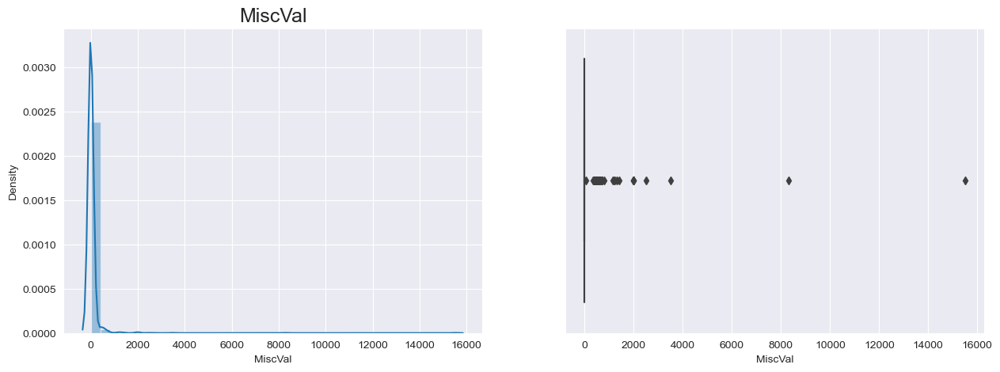

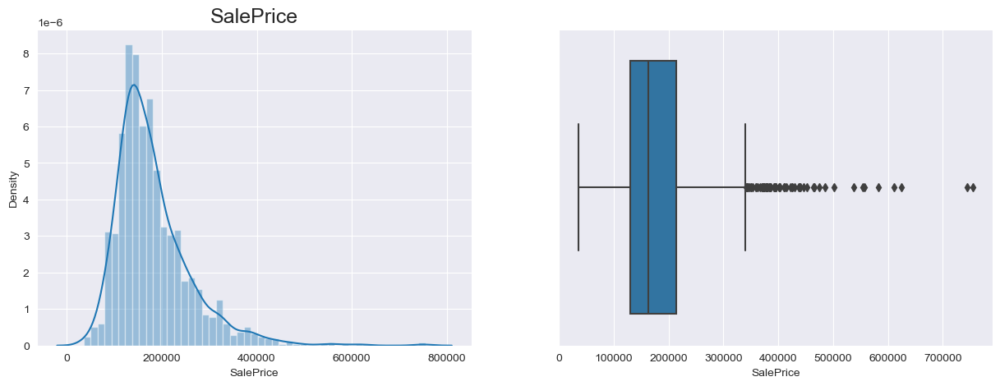

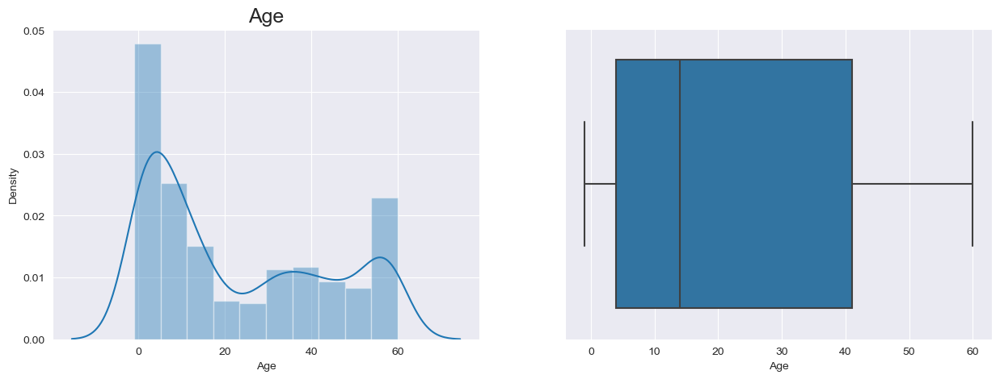

In [41]:
#Plotting distribution and box plot for each numerical attributes
for col in numeric_feats:
    plt.figure(figsize=(15,5))
    
    plt.subplot(1,2,1)
    plt.title(col, fontdict={'fontsize': 18})
    sns.distplot(df[col])
    
    plt.subplot(1,2,2)
    sns.boxplot(df[col])
    plt.show()  

- We do see some attributes are Right skewed. 

In [42]:
## Extract categorical columns
df_cat = df.select_dtypes(include='object')
df_cat.head()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageYrBlt,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,No_alley_access,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,2003.0,RFn,TA,TA,Y,No_Pool,No_Fence,None,WD,Normal
1,RL,Pave,No_alley_access,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,...,1976.0,RFn,TA,TA,Y,No_Pool,No_Fence,None,WD,Normal
2,RL,Pave,No_alley_access,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,2001.0,RFn,TA,TA,Y,No_Pool,No_Fence,None,WD,Normal
3,RL,Pave,No_alley_access,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,...,1998.0,Unf,TA,TA,Y,No_Pool,No_Fence,None,WD,Abnorml
4,RL,Pave,No_alley_access,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,...,2000.0,RFn,TA,TA,Y,No_Pool,No_Fence,None,WD,Normal


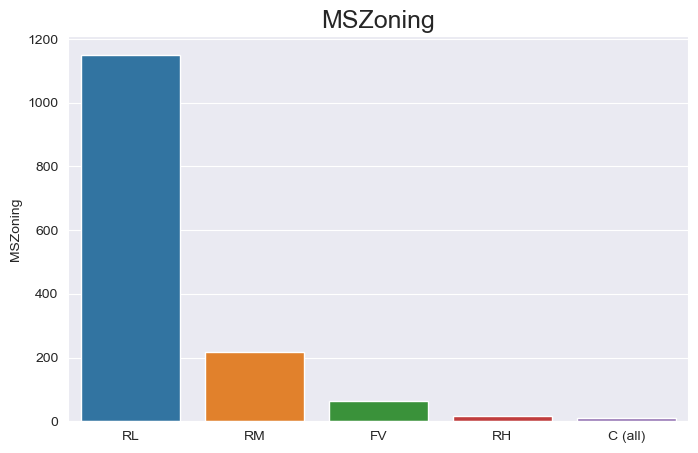

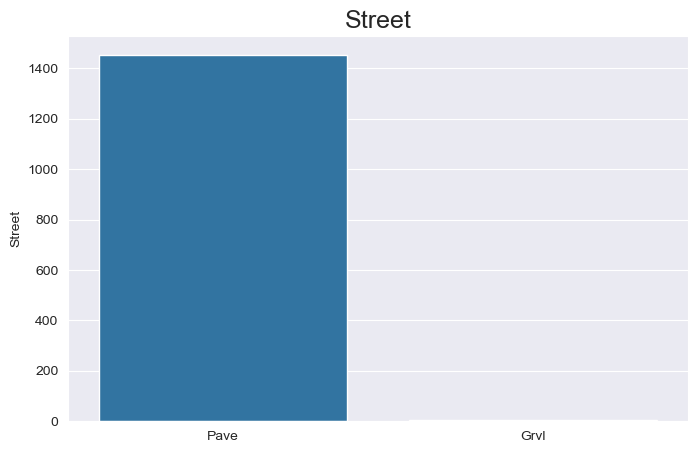

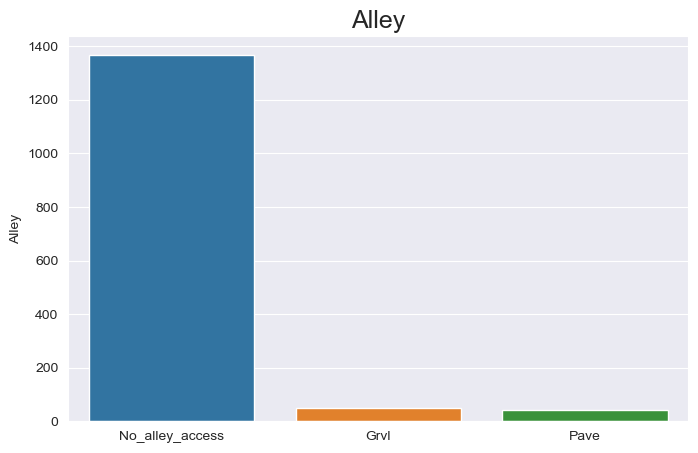

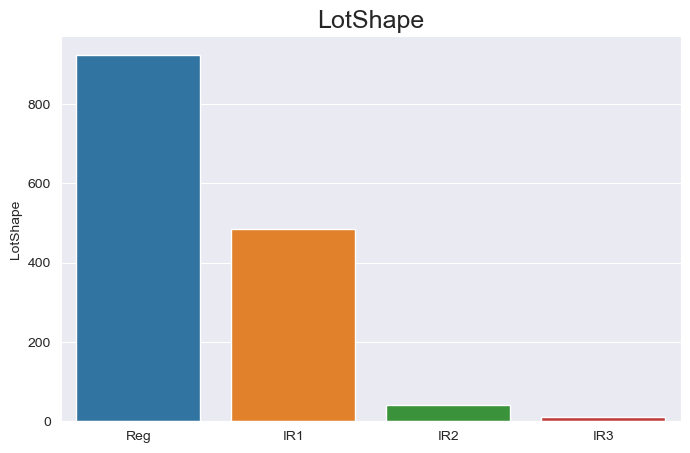

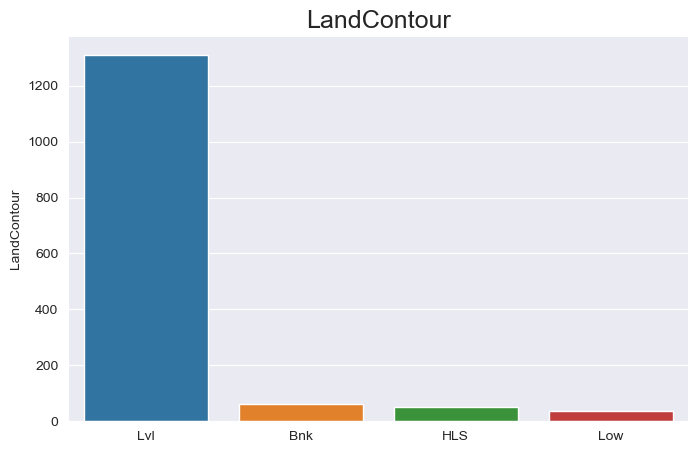

...

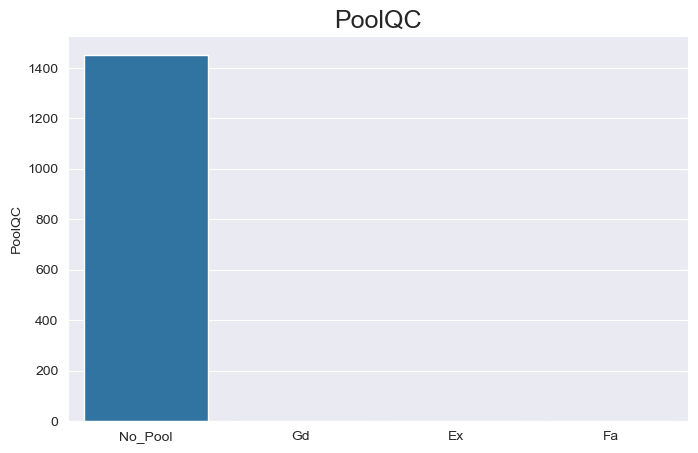

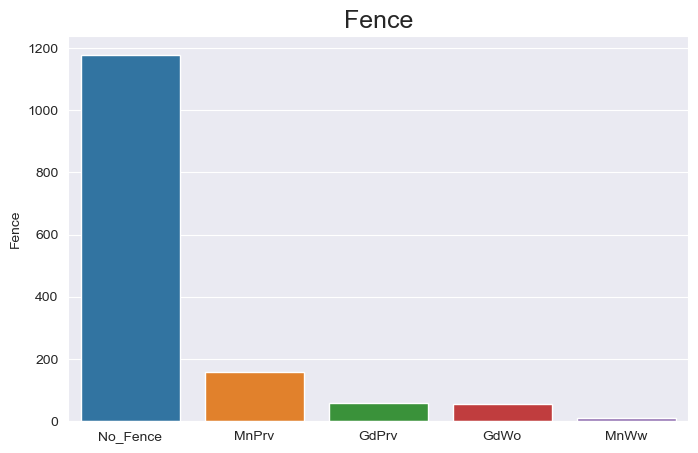

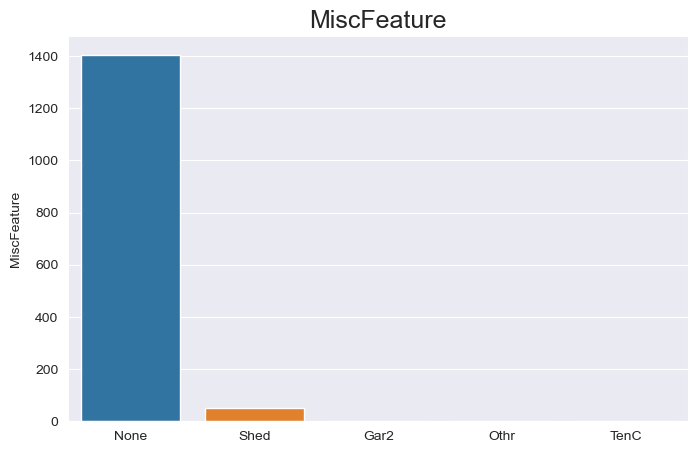

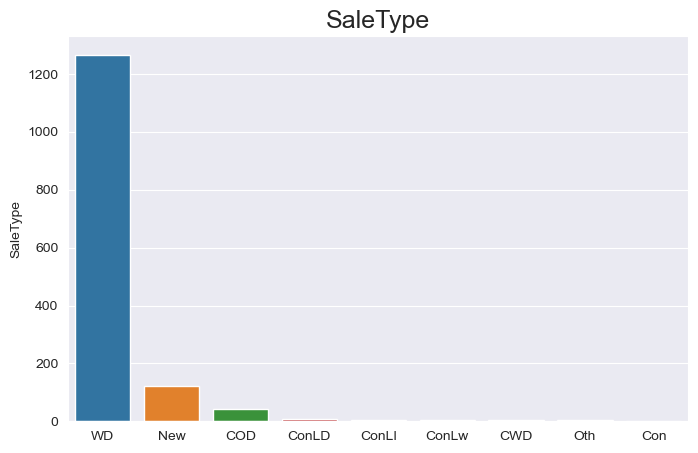

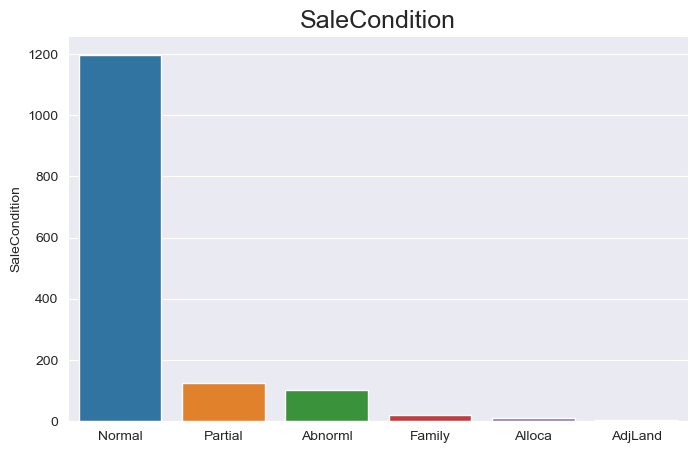

In [45]:
# Plotting barplot for all catagorical fetaures.
for col in df_cat.columns:
    plt.figure(figsize=(8,5))
    plt.title(col, fontdict={'fontsize': 18})
    sns.barplot(df_cat[col].value_counts().index, df_cat[col].value_counts())
    plt.show()

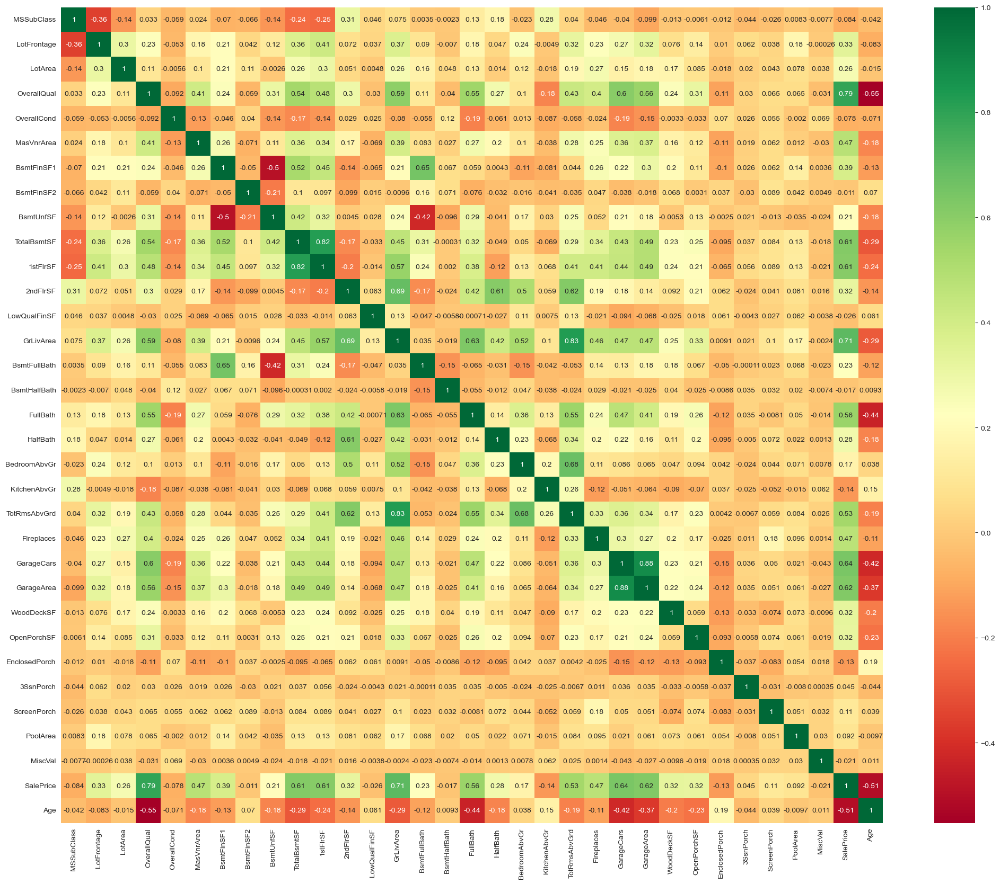

In [46]:
df_num = df[numeric_feats]

# Plot heatmap to detect correlations among numerical variables
plt.figure(figsize=(25,20))
sns.heatmap(df_num.corr(), annot=True, cmap='RdYlGn');

- We do see some good corelation of independent variables with sale price 
- Few variables are moderately  co-related with each other.

In [47]:
## Separate the categorical and numerical features again from original dataframe
## (as we have added one feature and removed two from original data)
df_num = df.select_dtypes(include=['int64', 'float64'])
df_cat = df.select_dtypes(include='object')

In [48]:
df.shape

(1460, 77)

### Creating Dummy variables for catagorical feataures - one hot encoding

In [49]:
#creating dummy variables for all catagorical levels using drop first  
df = pd.get_dummies(data=df,columns=df_cat.columns,drop_first=True)


In [50]:
df.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,65.0,8450,7,5,196.0,706,0,150,856,...,0,0,0,0,1,0,0,0,1,0
1,20,80.0,9600,6,8,0.0,978,0,284,1262,...,0,0,0,0,1,0,0,0,1,0
2,60,68.0,11250,7,5,162.0,486,0,434,920,...,0,0,0,0,1,0,0,0,1,0
3,70,60.0,9550,7,5,0.0,216,0,540,756,...,0,0,0,0,1,0,0,0,0,0
4,60,84.0,14260,8,5,350.0,655,0,490,1145,...,0,0,0,0,1,0,0,0,1,0


In [51]:
df.columns

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       ...
       'SaleType_ConLI', 'SaleType_ConLw', 'SaleType_New', 'SaleType_Oth',
       'SaleType_WD', 'SaleCondition_AdjLand', 'SaleCondition_Alloca',
       'SaleCondition_Family', 'SaleCondition_Normal',
       'SaleCondition_Partial'],
      dtype='object', length=353)

### Splitting the Data into Training and Testing Sets

In [52]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

df_train, df_test = train_test_split(df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [53]:
#Check shape of train set 
df_train.shape

(1021, 353)

### Rescaling the Features
##### We will use MinMax scaling.

In [54]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [55]:
#Describing and checking all numeriacl variables max values
df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,69.863699,10516.828082,6.099315,5.575342,103.117123,443.639726,46.549315,567.240411,1057.429452,...,0.003425,0.003425,0.083562,0.002055,0.867808,0.002740,0.008219,0.013699,0.820548,0.085616
std,42.300571,22.027677,9981.264932,1.382997,1.112799,180.731373,456.098091,161.319273,441.866955,438.705324,...,0.058440,0.058440,0.276824,0.045299,0.338815,0.052289,0.090317,0.116277,0.383862,0.279893
min,20.000000,21.000000,1300.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,20.000000,60.000000,7553.500000,5.000000,5.000000,0.000000,0.000000,0.000000,223.000000,795.750000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,0.000000,383.500000,0.000000,477.500000,991.500000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,70.000000,79.000000,11601.500000,7.000000,6.000000,164.250000,712.250000,0.000000,808.000000,1298.250000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [56]:
#Check Max values
df_train.max().to_frame().T

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,190.0,313.0,215245.0,10.0,9.0,1600.0,5644.0,1474.0,2336.0,6110.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [57]:
#Scaling using MinMax scaler object
df_train[df_num.columns] = scaler.fit_transform(df_train[df_num.columns])
df_train.head(10)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
210,0.058824,0.157534,0.019306,0.444444,0.625,0.0000,0.082920,0.000000,0.169521,0.141408,...,0,0,0,0,1,0,0,0,1,0
318,0.235294,0.236301,0.039403,0.666667,0.500,0.1600,0.174876,0.000000,0.154110,0.220458,...,0,0,0,0,1,0,0,0,1,0
239,0.176471,0.106164,0.033981,0.555556,0.375,0.0000,0.016655,0.000000,0.274401,0.120295,...,0,0,0,0,1,0,0,0,1,0
986,0.176471,0.130137,0.017931,0.555556,0.875,0.0000,0.000000,0.000000,0.207620,0.079378,...,0,0,0,0,1,0,0,0,1,0
1416,1.000000,0.133562,0.046139,0.333333,0.625,0.0000,0.000000,0.000000,0.332620,0.127169,...,0,0,0,0,1,0,0,0,1,0
390,0.176471,0.099315,0.032409,0.444444,0.875,0.0000,0.042700,0.265265,0.098031,0.140917,...,0,0,0,0,1,0,0,0,1,0
1005,0.352941,0.150685,0.032315,0.444444,0.875,0.1375,0.105422,0.000000,0.166952,0.161211,...,0,0,0,0,1,0,0,0,1,0
568,0.176471,0.198630,0.050756,0.777778,0.875,0.0000,0.255315,0.000000,0.023545,0.244845,...,0,0,0,0,1,0,0,0,1,0
342,0.411765,0.164384,0.033059,0.222222,0.375,0.2125,0.000000,0.000000,0.000000,0.000000,...,0,0,0,0,1,0,0,0,1,0
114,0.294118,0.136986,0.027048,0.555556,0.875,0.0000,0.137137,0.101764,0.044521,0.168249,...,0,0,0,0,1,0,0,0,1,0


In [58]:
pd.set_option('display.max_columns', None)
df_train.max().to_frame().T

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice,Age,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_No_alley_access,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No_Basement,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No_Basement,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_No_Basement,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No_Basement,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No_Basement,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NoFireplace,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No_Garage,GarageYrBlt_1906.0,GarageYrBlt_1908.0,GarageYrBlt_1910.0,GarageYrBlt_1914.0,GarageYrBlt_1915.0,GarageYrBlt_1916.0,GarageYrBlt_1918.0,GarageYrBlt_1920.0,GarageYrBlt_1921.0,GarageYrBlt_1922.0,GarageYrBlt_1923.0,GarageYrBlt_1924.0,GarageYrBlt_1925.0,GarageYrBlt_1926.0,GarageYrBlt_1927.0,GarageYrBlt_1928.0,GarageYrBlt_1929.0,GarageYrBlt_1930.0,GarageYrBlt_1931.0,GarageYrBlt_1932.0,GarageYrBlt_1933.0,GarageYrBlt_1934.0,GarageYrBlt_1935.0,GarageYrBlt_1936.0,GarageYrBlt_1937.0,GarageYrBlt_1938.0,Garag

In [59]:
df_train.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice,Age,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_No_alley_access,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No_Basement,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No_Basement,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_No_Basement,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No_Basement,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No_Basement,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NoFireplace,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No_Garage,GarageYrBlt_1906.0,GarageYrBlt_1908.0,GarageYrBlt_1910.0,GarageYrBlt_1914.0,GarageYrBlt_1915.0,GarageYrBlt_1916.0,GarageYrBlt_1918.0,GarageYrBlt_1920.0,GarageYrBlt_1921.0,GarageYrBlt_1922.0,GarageYrBlt_1923.0,GarageYrBlt_1924.0,GarageYrBlt_1925.0,GarageYrBlt_1926.0,GarageYrBlt_1927.0,GarageYrBlt_1928.0,GarageYrBlt_1929.0,GarageYrBlt_1930.0,GarageYrBlt_1931.0,GarageYrBlt_1932.0,GarageYrBlt_1933.0,GarageYrBlt_1934.0,GarageYrBlt_1935.0,GarageYrBlt_1936.0,GarageYrBlt_1937.0,GarageYrBlt_1938.0,Garag

#### Dividing into X and Y sets for the model building

In [60]:
#cnt is our target variable 
y_train = df_train.pop('SalePrice')
x_train = df_train

In [61]:
y_train.shape

(1021,)

In [62]:
x_train.shape

(1021, 352)

### Building  model
##### we will be using RFE for feature selection.
#### Then we will build a Linear regression model using statsmodel
#### Then we will build model using Ridge model of sklearn. 
#### Then we will build model using Lasso of sklearn. 

In [63]:
#Importing RFE and LinerRegression 
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score,mean_squared_error

from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV



In [64]:
np.any(np.isnan(x_train))

False

In [65]:
#Creating a model using RFE with 15 features 
lr = LinearRegression()
lr.fit(x_train, y_train)



LinearRegression()

In [70]:
y_train_pred = lr.predict(x_train)


In [71]:
r2_score(y_train,y_train_pred)

0.9580020455221343

### Model Predictions on test set
#### Applying the scaling on the test sets

In [66]:
#Scaling using MinMax scaler object
df_test[df_num.columns] = scaler.transform(df_test[df_num.columns])
df_test.head(10)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice,Age,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_No_alley_access,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No_Basement,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No_Basement,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_No_Basement,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No_Basement,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No_Basement,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NoFireplace,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No_Garage,GarageYrBlt_1906.0,GarageYrBlt_1908.0,GarageYrBlt_1910.0,GarageYrBlt_1914.0,GarageYrBlt_1915.0,GarageYrBlt_1916.0,GarageYrBlt_1918.0,GarageYrBlt_1920.0,GarageYrBlt_1921.0,GarageYrBlt_1922.0,GarageYrBlt_1923.0,GarageYrBlt_1924.0,GarageYrBlt_1925.0,GarageYrBlt_1926.0,GarageYrBlt_1927.0,GarageYrBlt_1928.0,GarageYrBlt_1929.0,GarageYrBlt_1930.0,GarageYrBlt_1931.0,GarageYrBlt_1932.0,GarageYrBlt_1933.0,GarageYrBlt_1934.0,GarageYrBlt_1935.0,GarageYrBlt_1936.0,GarageYrBlt_1937.0,GarageYrBlt_1938.0,Garag

#### Dividing into X_test and y_test

In [67]:
# As cnt is our target variable
y_test = df_test.pop('SalePrice')
x_test = df_test

In [68]:
y_test.shape

(438,)

In [69]:
x_test.shape

(438, 352)

In [350]:
# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from x_train
x_test_lr = x_test[x_train.columns]


In [73]:
#Making prediction

y_test_pred = lr.predict(x_test)

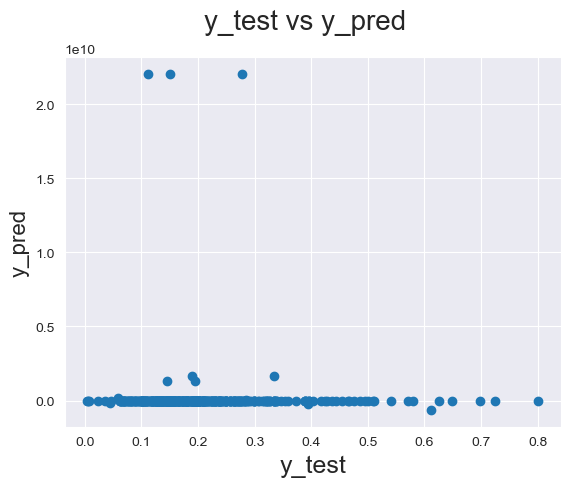

In [74]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_test_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              
plt.xlabel('y_test', fontsize=18)                          
plt.ylabel('y_pred', fontsize=16)
plt.show()

In [75]:
### Calculating R2 for test dataset

r2_score(y_test,y_test_pred)

-2.6980747750341352e+20

In [76]:
print("Training R2")
print(lr.score(x_train,y_train))
print("Testing R2")
print(lr.score(x_test,y_test))

Training R2
0.9580020455221343
Testing R2
-2.6980747750341352e+20


In [78]:
metric = []
r2_train_lr = r2_score(y_train, y_train_pred)
print(r2_train_lr)
metric.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_test_pred)
print(r2_test_lr)
metric.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_train_pred))
print(rss1_lr)
metric.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_test_pred))
print(rss2_lr)
metric.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_train_pred)
print(mse_train_lr)
metric.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_test_pred)
print(mse_test_lr)
metric.append(mse_test_lr**0.5)

0.9580020455221343
-2.6980747750341352e+20
0.5167860250037604
1.4666252101168498e+21
0.0005061567335981981
3.348459383828424e+18


In [107]:
lr.coef_

array([-2.41297659e-02,  4.48513355e-02,  2.03382145e-01,  8.08747732e-02,
        4.37661845e-02,  5.29298356e-02, -7.93869257e+10, -2.07328718e+10,
       -3.28575228e+10,  8.59415514e+10,  6.16021379e+10,  2.94463923e+10,
        7.34377338e+09, -7.42077605e+10,  1.07584000e-02, -1.08432770e-03,
        1.31851435e-02, -7.41958618e-03, -2.54888535e-02, -5.99555969e-02,
       -1.45492554e-02,  7.80296326e-03,  2.29666233e-02,  2.06537247e-02,
        1.30131245e-02,  1.98879242e-02,  2.98565626e-03,  1.59232616e-02,
        9.32347775e-03,  5.52356052e+00,  1.51912212e-01, -1.61975622e-02,
        3.05047035e-02,  4.05743122e-02,  3.97605896e-02,  3.04937363e-02,
        3.03192139e-02,  1.01127625e-02,  4.12583351e-03,  1.03902817e-03,
       -4.71401215e-03,  3.95298004e-03, -5.13792038e-03, -1.40151978e-02,
       -7.94887543e-04, -2.75902748e-02,  1.72271729e-02, -1.43504143e-02,
        3.38315964e-04, -2.91824341e-04, -4.00543213e-05, -4.58720326e-02,
        2.92301178e-02,  

In [110]:
lr.feature_names_in_

array(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch',
       'PoolArea', 'MiscVal', 'Age', 'MSZoning_FV', 'MSZoning_RH',
       'MSZoning_RL', 'MSZoning_RM', 'Street_Pave',
       'Alley_No_alley_access', 'Alley_Pave', 'LotShape_IR2',
       'LotShape_IR3', 'LotShape_Reg', 'LandContour_HLS',
       'LandContour_Low', 'LandContour_Lvl', 'Utilities_NoSeWa',
       'LotConfig_CulDSac', 'LotConfig_FR2', 'LotConfig_FR3',
       'LotConfig_Inside', 'LandSlope_Mod', 'LandSlope_Sev',
       'Neighborhood_Blueste', 'Neighborhood_BrDale',
       'Neighborhood_BrkSide', 'Neighborhood_ClearCr',
  

In [112]:
coef_dict = {}

for coef, feat in zip(lr.coef_,lr.feature_names_in_):

    coef_dict[feat] = coef
coef_dict

{'MSSubClass': -0.024129765860449723,
 'LotFrontage': 0.044851335481392564,
 'LotArea': 0.20338214518399925,
 'OverallQual': 0.08087477315777306,
 'OverallCond': 0.0437661845060461,
 'MasVnrArea': 0.052929835576938214,
 'BsmtFinSF1': -79386925748.01384,
 'BsmtFinSF2': -20732871820.11103,
 'BsmtUnfSF': -32857522775.988514,
 'TotalBsmtSF': 85941551439.13411,
 '1stFlrSF': 61602137881.1019,
 '2ndFlrSF': 29446392297.39361,
 'LowQualFinSF': 7343773381.647475,
 'GrLivArea': -74207760539.7029,
 'BsmtFullBath': 0.010758399963378906,
 'BsmtHalfBath': -0.0010843276977539062,
 'FullBath': 0.01318514347076416,
 'HalfBath': -0.007419586181640625,
 'BedroomAbvGr': -0.025488853454589844,
 'KitchenAbvGr': -0.059955596923828125,
 'TotRmsAbvGrd': -0.01454925537109375,
 'Fireplaces': 0.0078029632568359375,
 'GarageCars': 0.022966623306274414,
 'GarageArea': 0.020653724670410156,
 'WoodDeckSF': 0.013013124465942383,
 'OpenPorchSF': 0.019887924194335938,
 'EnclosedPorch': 0.002985656261444092,
 '3SsnPorch':

In [117]:
coef_df = pd.DataFrame.from_dict(coef_dict, orient ='index')

In [120]:
coef_df

,0
MSSubClass,-2.412977e-02
LotFrontage,4.485134e-02
LotArea,2.033821e-01
OverallQual,8.087477e-02
OverallCond,4.376618e-02
MasVnrArea,5.292984e-02
BsmtFinSF1,-7.938693e+10
BsmtFinSF2,-2.073287e+10
BsmtUnfSF,-3.285752e+10
TotalBsmtSF,8.594155e+10


### Ridge Regression

In [152]:
# list of alphas to tune - if value too high it will lead to underfitting, if it is too low, 
# it will not handle the overfitting
params = {'alpha': [0.0001, 0.001, 0.002, 0.01, 0.02, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

# cross validation
folds = 5
model_cv_ridge = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'r2',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv_ridge.fit(x_train, y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.002, 0.01, 0.02, 0.05, 0.1,
                                   0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0,
                                   2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0,
                                   20, 50, 100, 500, 1000]},
             return_train_score=True, scoring='r2', verbose=1)

In [153]:
cv_results_ridge = pd.DataFrame(model_cv_ridge.cv_results_)
cv_results_ridge.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.008531,0.000909,0.003075,0.000371,0.0001,{'alpha': 0.0001},0.719382,0.500169,0.718316,0.838944,0.852124,0.725787,0.126306,26,0.964458,0.958391,0.962046,0.963605,0.966343,0.962968,0.002676
1,0.007837,0.000371,0.002778,0.000397,0.001,{'alpha': 0.001},0.723445,0.502474,0.717606,0.828363,0.851574,0.724692,0.123514,28,0.964452,0.958387,0.961232,0.962819,0.965413,0.962460,0.002487
2,0.007936,0.000543,0.002877,0.000198,0.002,{'alpha': 0.002},0.727297,0.504364,0.717581,0.826144,0.852554,0.725588,0.122670,27,0.964439,0.958378,0.960921,0.962522,0.965070,0.962266,0.002432
3,0.008333,0.000854,0.002877,0.000199,0.01,{'alpha': 0.01},0.750586,0.512855,0.720451,0.828193,0.857102,0.733837,0.121153,25,0.964272,0.958305,0.960447,0.962061,0.964494,0.961916,0.002341
4,0.007737,0.000397,0.002877,0.000199,0.02,{'alpha': 0.02},0.772006,0.519955,0.724234,0.832902,0.859451,0.741709,0.120480,24,0.963953,0.958215,0.960193,0.961782,0.964119,0.961652,0.002251


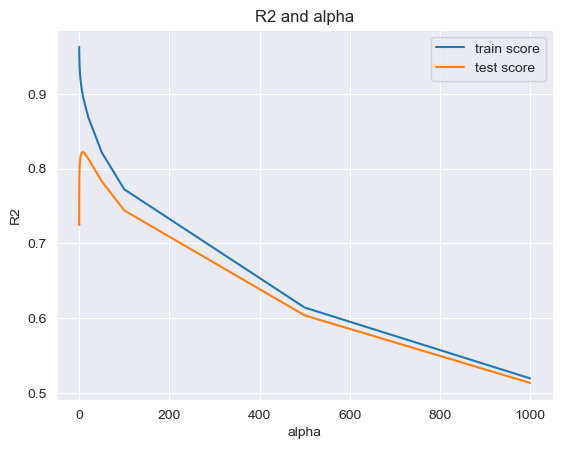

In [154]:
# plotting mean test and train scoes with alpha 
cv_results_ridge['param_alpha'] = cv_results_ridge['param_alpha'].astype('float32')

# plotting
plt.plot(cv_results_ridge['param_alpha'], cv_results_ridge['mean_train_score'])
plt.plot(cv_results_ridge['param_alpha'], cv_results_ridge['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('R2')

plt.title("R2 and alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [84]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 8.0}


In [86]:
#Fitting Ridge model for alpha = 8 and printing coefficients which have been penalised
alpha = 8.0
ridge = Ridge(alpha=alpha)

ridge.fit(x_train, y_train)
print(ridge.coef_)

[-2.60587089e-02 -1.37003816e-04  2.01006470e-02  7.28425048e-02
  2.55202094e-02  2.92853101e-02  1.71187734e-02  8.80709629e-03
  2.10537334e-02  2.59871584e-02  4.64575223e-02  6.32272282e-02
 -5.34734564e-03  6.31258339e-02  2.62298598e-02 -2.73554570e-04
  4.24426381e-02  1.11162533e-02  8.76850673e-03 -1.28635352e-02
  4.22847351e-02  2.12315287e-02  4.16437131e-02  2.68593267e-02
  1.80991604e-02  5.04687343e-03  9.99206319e-04  1.09682532e-02
  7.40678913e-03  6.54092730e-03 -3.42474817e-04 -1.85107747e-02
  3.72487671e-03  6.91549753e-03  1.24217271e-02  4.85634938e-03
  3.85957956e-03  1.53266811e-03  3.19160863e-03  3.24993126e-03
 -1.22355569e-02  5.80534132e-04  1.35130529e-02  1.45246313e-02
  1.75732152e-02 -5.23060660e-03  1.52984572e-02 -1.53557086e-02
 -5.06738000e-03 -3.48426123e-03  7.26797761e-03  5.63401384e-03
 -8.09854166e-04 -2.31813575e-03 -3.49377702e-03  1.25975038e-03
 -1.06771114e-02  2.86313720e-02 -2.58122065e-02 -1.61472593e-02
 -1.30754801e-02 -8.63080

In [88]:
x_test_new = x_test

In [89]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = ridge.predict(x_train)
y_pred_test = ridge.predict(x_test_new)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric2.append(mse_test_lr**0.5)

0.8946506403409424
0.8587930428723037
1.296326868576163
0.767575773227962
0.001269663926127486
0.0017524561032601872


In [121]:
coef_dict_ridge = {}

for coef, feat in zip(ridge.coef_,ridge.feature_names_in_):

    coef_dict_ridge[feat] = coef
coef_dict_ridge

{'MSSubClass': -0.026058708893348558,
 'LotFrontage': -0.00013700381607056075,
 'LotArea': 0.020100647045209957,
 'OverallQual': 0.0728425048172375,
 'OverallCond': 0.02552020944309063,
 'MasVnrArea': 0.02928531013638251,
 'BsmtFinSF1': 0.017118773371275722,
 'BsmtFinSF2': 0.008807096286996595,
 'BsmtUnfSF': 0.021053733350098976,
 'TotalBsmtSF': 0.025987158419041975,
 '1stFlrSF': 0.04645752227188367,
 '2ndFlrSF': 0.06322722824136276,
 'LowQualFinSF': -0.005347345643801679,
 'GrLivArea': 0.06312583388285842,
 'BsmtFullBath': 0.02622985982097393,
 'BsmtHalfBath': -0.00027355457040592976,
 'FullBath': 0.04244263805886501,
 'HalfBath': 0.01111625326972599,
 'BedroomAbvGr': 0.008768506726321507,
 'KitchenAbvGr': -0.012863535196854162,
 'TotRmsAbvGrd': 0.04228473508499811,
 'Fireplaces': 0.021231528698506242,
 'GarageCars': 0.04164371313566228,
 'GarageArea': 0.02685932671517134,
 'WoodDeckSF': 0.018099160372939075,
 'OpenPorchSF': 0.005046873429508603,
 'EnclosedPorch': 0.000999206318646208

In [125]:
coef_df_ridge = pd.DataFrame.from_dict(coef_dict_ridge, orient ='index')
coef_df_ridge

,0
MSSubClass,-0.026059
LotFrontage,-0.000137
LotArea,0.020101
OverallQual,0.072843
OverallCond,0.025520
MasVnrArea,0.029285
BsmtFinSF1,0.017119
BsmtFinSF2,0.008807
BsmtUnfSF,0.021054
TotalBsmtSF,0.025987


### Lasso Regularization

In [172]:
params = {'alpha': [0.00001,0.00005, 0.0001, 0.0002,0.0002 0.00005, 0.001, 0.01, 0.02, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}


lasso1 = Lasso()

# cross validation
model_cv_lasso = GridSearchCV(estimator = lasso1, 
                        param_grid = params, 
                        scoring= 'r2', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv_lasso.fit(x_train, y_train) 

Fitting 5 folds for each of 33 candidates, totalling 165 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [1e-05, 5e-05, 0.0001, 0.0002, 5e-05, 0.001,
                                   0.01, 0.02, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5,
                                   0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0,
                                   6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, ...]},
             return_train_score=True, scoring='r2', verbose=1)

In [173]:
cv_results_lasso = pd.DataFrame(model_cv_lasso.cv_results_)
cv_results_lasso.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.123405,0.003848,0.003075,0.000198,0.00001,{'alpha': 1e-05},0.794693,0.577563,0.743498,0.875309,0.882810,0.774775,0.111397,6,0.962817,0.956689,0.959083,0.960690,0.962485,0.960353,0.002270
1,0.065075,0.009078,0.003174,0.000243,0.00005,{'alpha': 5e-05},0.880534,0.643759,0.776415,0.895492,0.896168,0.818474,0.098096,3,0.952328,0.948495,0.950269,0.951550,0.950152,0.950559,0.001313
2,0.037101,0.002933,0.003174,0.000243,0.0001,{'alpha': 0.0001},0.899125,0.679390,0.793921,0.899684,0.888358,0.832096,0.086027,2,0.939502,0.941322,0.940153,0.939980,0.936967,0.939585,0.001439
3,0.020534,0.001974,0.003373,0.000199,0.0002,{'alpha': 0.0002},0.893419,0.713721,0.806713,0.892978,0.873178,0.836002,0.068899,1,0.920169,0.928184,0.924005,0.919443,0.916295,0.921619,0.004098
4,0.063984,0.007535,0.003075,0.000198,0.00005,{'alpha': 5e-05},0.880534,0.643759,0.776415,0.895492,0.896168,0.818474,0.098096,3,0.952328,0.948495,0.950269,0.951550,0.950152,0.950559,0.001313


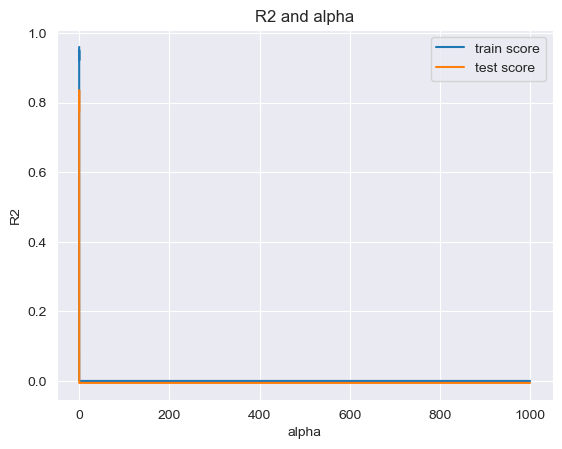

In [174]:
# plotting mean test and train scoes with alpha 
cv_results_lasso['param_alpha'] = cv_results_lasso['param_alpha'].astype('float32')

# plotting
plt.plot(cv_results_lasso['param_alpha'], cv_results_lasso['mean_train_score'])
plt.plot(cv_results_lasso['param_alpha'], cv_results_lasso['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('R2')

plt.title("R2 and alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [185]:
# Printing the best hyperparameter alpha
print(model_cv_lasso.best_params_)

{'alpha': 0.0002}


In [186]:
params = {'alpha': np.arange(0.00001, 0.001, 0.00001)}

In [189]:



lasso_opt = Lasso()

# cross validation
model_cv_lasso_opt = GridSearchCV(estimator = lasso_opt, 
                        param_grid = params, 
                        scoring= 'r2', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv_lasso_opt.fit(x_train, y_train) 

Fitting 5 folds for each of 99 candidates, totalling 495 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': array([1.0e-05, 2.0e-05, 3.0e-05, 4.0e-05, 5.0e-05, 6.0e-05, 7.0e-05,
       8.0e-05, 9.0e-05, 1.0e-04, 1.1e-04, 1.2e-04, 1.3e-04, 1.4e-04,
       1.5e-04, 1.6e-04, 1.7e-04, 1.8e-04, 1.9e-04, 2.0e-04, 2.1e-04,
       2.2e-04, 2.3e-04, 2.4e-04, 2.5e-04, 2.6e-04, 2.7e-04, 2.8e-04,
       2.9e-04, 3.0e-04, 3.1e-04, 3.2e-04, 3.3e-04, 3.4e-04, 3.5e-04,
       3.6e-04...
       5.7e-04, 5.8e-04, 5.9e-04, 6.0e-04, 6.1e-04, 6.2e-04, 6.3e-04,
       6.4e-04, 6.5e-04, 6.6e-04, 6.7e-04, 6.8e-04, 6.9e-04, 7.0e-04,
       7.1e-04, 7.2e-04, 7.3e-04, 7.4e-04, 7.5e-04, 7.6e-04, 7.7e-04,
       7.8e-04, 7.9e-04, 8.0e-04, 8.1e-04, 8.2e-04, 8.3e-04, 8.4e-04,
       8.5e-04, 8.6e-04, 8.7e-04, 8.8e-04, 8.9e-04, 9.0e-04, 9.1e-04,
       9.2e-04, 9.3e-04, 9.4e-04, 9.5e-04, 9.6e-04, 9.7e-04, 9.8e-04,
       9.9e-04])},
             return_train_score=True, scoring='r2', verbose=1)

In [190]:
model_cv_lasso_opt.best_params_

{'alpha': 0.00018}

In [191]:
#Fitting Ridge model for alpha = 0.0002 and printing coefficients which have been penalised

alpha =0.00018

lasso_opt2 = Lasso(alpha=alpha)
        
lasso_opt2.fit(x_train, y_train) 

Lasso(alpha=0.00018)

In [193]:
lasso_opt2.coef_

array([-3.34879207e-02,  0.00000000e+00,  1.65545017e-02,  1.24827803e-01,
        3.24430050e-02,  2.84808766e-02,  9.01544756e-03,  0.00000000e+00,
        0.00000000e+00,  8.62238241e-02,  0.00000000e+00,  2.02303020e-02,
       -1.59689662e-02,  3.46689635e-01,  2.93702478e-02,  0.00000000e+00,
        1.49078661e-02,  0.00000000e+00, -0.00000000e+00, -1.50172894e-02,
        0.00000000e+00,  1.67164637e-02,  4.25991969e-02,  8.52345686e-03,
        1.01495883e-02,  0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -1.71711090e-02,
        0.00000000e+00,  0.00000000e+00,  1.02842586e-02, -0.00000000e+00,
        0.00000000e+00,  3.01652297e-03, -0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00,  1.83846274e-03,  3.81167881e-03,
        5.82156280e-03, -0.00000000e+00,  1.39021767e-02, -5.26172730e-03,
       -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00,  

In [194]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = lasso_opt2.predict(x_train)
y_pred_test = lasso_opt2.predict(x_test_new)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric2.append(mse_test_lr**0.5)

0.9178563572706558
0.7762235732511631
1.0107798613810997
1.2164086478869311
0.0009899900699129281
0.0027771886938057788


In [197]:
coef_dict_lasso = {}

for coef, feat in zip(lasso_opt2.coef_,lasso_opt2.feature_names_in_):

    coef_dict_lasso[feat] = coef
coef_dict_lasso

{'MSSubClass': -0.033487920727484806,
 'LotFrontage': 0.0,
 'LotArea': 0.01655450166253294,
 'OverallQual': 0.12482780257394321,
 'OverallCond': 0.03244300501565384,
 'MasVnrArea': 0.028480876646878137,
 'BsmtFinSF1': 0.00901544756057956,
 'BsmtFinSF2': 0.0,
 'BsmtUnfSF': 0.0,
 'TotalBsmtSF': 0.08622382407556481,
 '1stFlrSF': 0.0,
 '2ndFlrSF': 0.020230302015543534,
 'LowQualFinSF': -0.01596896622619113,
 'GrLivArea': 0.3466896347663033,
 'BsmtFullBath': 0.02937024781764622,
 'BsmtHalfBath': 0.0,
 'FullBath': 0.014907866127584365,
 'HalfBath': 0.0,
 'BedroomAbvGr': -0.0,
 'KitchenAbvGr': -0.015017289405114443,
 'TotRmsAbvGrd': 0.0,
 'Fireplaces': 0.0167164637285186,
 'GarageCars': 0.04259919693794164,
 'GarageArea': 0.008523456863114828,
 'WoodDeckSF': 0.010149588296967419,
 'OpenPorchSF': 0.0,
 'EnclosedPorch': -0.0,
 '3SsnPorch': 0.0,
 'ScreenPorch': 0.0,
 'PoolArea': 0.0,
 'MiscVal': 0.0,
 'Age': -0.0171711089682323,
 'MSZoning_FV': 0.0,
 'MSZoning_RH': 0.0,
 'MSZoning_RL': 0.0102842

In [198]:
coef_df_lasso = pd.DataFrame.from_dict(coef_dict_lasso, orient ='index')
coef_df_lasso

,0
MSSubClass,-0.033488
LotFrontage,0.000000
LotArea,0.016555
OverallQual,0.124828
OverallCond,0.032443
MasVnrArea,0.028481
BsmtFinSF1,0.009015
BsmtFinSF2,0.000000
BsmtUnfSF,0.000000
TotalBsmtSF,0.086224


In [199]:
betas1 = pd.merge(coef_df, coef_df_ridge, left_index=True, right_index=True)
print(betas1)

                                   0_x       0_y
MSSubClass               -2.412977e-02 -0.026059
LotFrontage               4.485134e-02 -0.000137
LotArea                   2.033821e-01  0.020101
OverallQual               8.087477e-02  0.072843
OverallCond               4.376618e-02  0.025520
MasVnrArea                5.292984e-02  0.029285
BsmtFinSF1               -7.938693e+10  0.017119
BsmtFinSF2               -2.073287e+10  0.008807
BsmtUnfSF                -3.285752e+10  0.021054
TotalBsmtSF               8.594155e+10  0.025987
1stFlrSF                  6.160214e+10  0.046458
2ndFlrSF                  2.944639e+10  0.063227
LowQualFinSF              7.343773e+09 -0.005347
GrLivArea                -7.420776e+10  0.063126
BsmtFullBath              1.075840e-02  0.026230
BsmtHalfBath             -1.084328e-03 -0.000274
FullBath                  1.318514e-02  0.042443
HalfBath                 -7.419586e-03  0.011116
BedroomAbvGr             -2.548885e-02  0.008769
KitchenAbvGr        

In [200]:
betas2 = pd.merge(betas1, coef_df_lasso, left_index=True, right_index=True)
print(betas2)

                                   0_x       0_y         0
MSSubClass               -2.412977e-02 -0.026059 -0.033488
LotFrontage               4.485134e-02 -0.000137  0.000000
LotArea                   2.033821e-01  0.020101  0.016555
OverallQual               8.087477e-02  0.072843  0.124828
OverallCond               4.376618e-02  0.025520  0.032443
MasVnrArea                5.292984e-02  0.029285  0.028481
BsmtFinSF1               -7.938693e+10  0.017119  0.009015
BsmtFinSF2               -2.073287e+10  0.008807  0.000000
BsmtUnfSF                -3.285752e+10  0.021054  0.000000
TotalBsmtSF               8.594155e+10  0.025987  0.086224
1stFlrSF                  6.160214e+10  0.046458  0.000000
2ndFlrSF                  2.944639e+10  0.063227  0.020230
LowQualFinSF              7.343773e+09 -0.005347 -0.015969
GrLivArea                -7.420776e+10  0.063126  0.346690
BsmtFullBath              1.075840e-02  0.026230  0.029370
BsmtHalfBath             -1.084328e-03 -0.000274  0.0000

In [201]:
betas2.rename(columns = {'0_x':'LinearRegressionCoff', '0_y':'RidgeCoff',
                              0:'LassoCoff'}, inplace = True)

In [202]:
betas2

,LinearRegressionCoff,RidgeCoff,LassoCoff
MSSubClass,-2.412977e-02,-0.026059,-0.033488
LotFrontage,4.485134e-02,-0.000137,0.000000
LotArea,2.033821e-01,0.020101,0.016555
OverallQual,8.087477e-02,0.072843,0.124828
OverallCond,4.376618e-02,0.025520,0.032443
MasVnrArea,5.292984e-02,0.029285,0.028481
BsmtFinSF1,-7.938693e+10,0.017119,0.009015
BsmtFinSF2,-2.073287e+10,0.008807,0.000000
BsmtUnfSF,-3.285752e+10,0.021054,0.000000
TotalBsmtSF,8.594155e+10,0.025987,0.086224


### Question 1

- What is the optimal value of alpha for ridge and lasso regression? 
- What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? 
- What will be the most important predictor variables after the change is implemented?

In [203]:
print(model_cv_ridge.best_params_)
print(model_cv_lasso_opt.best_params_)


{'alpha': 8.0}
{'alpha': 0.00018}


In [204]:
#Fitting Lasso model for alpha = 0.00036 and printing coefficients which have been penalised

alpha =0.00036

lasso3 = Lasso(alpha=alpha)
        
lasso3.fit(x_train, y_train) 

Lasso(alpha=0.00036)

In [205]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = lasso3.predict(x_train)
y_pred_test = lasso3.predict(x_test_new)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print('r2 Train')
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print('r2 Test')
print(r2_test_lr)
metric2.append(r2_test_lr)

r2 Train
0.8756792410107785
r2 Test
0.8460443051326964


In [208]:
coef_dict_lasso3 = {}

for coef, feat in zip(lasso3.coef_,lasso3.feature_names_in_):

    coef_dict_lasso3[feat] = coef
coef_df_lasso3 = pd.DataFrame.from_dict(coef_dict_lasso3, orient ='index')


,0
MSSubClass,-0.037102
LotFrontage,0.000000
LotArea,0.000000
OverallQual,0.149536
OverallCond,0.015814
MasVnrArea,0.005073
BsmtFinSF1,0.000000
BsmtFinSF2,0.000000
BsmtUnfSF,0.000000
TotalBsmtSF,0.000000


In [209]:
coef_df_lasso3.sort_values(0, axis = 0, ascending = False)

,0
GrLivArea,0.299495
OverallQual,0.149536
Neighborhood_NoRidge,0.067711
GarageCars,0.056264
RoofMatl_WdShngl,0.041293
Neighborhood_NridgHt,0.040054
BsmtExposure_Gd,0.032932
BsmtFullBath,0.025781
Neighborhood_Somerst,0.025190
Neighborhood_Crawfor,0.023171


In [211]:
#Calculating absolute value to include negative cofficient into consideration
coef_df_lasso3_abs = coef_df_lasso3[0].abs()

In [216]:
coef_df_lasso3_abs = pd.DataFrame(coef_df_lasso3_abs)

In [219]:
#Sorting in descending order
coef_df_lasso3_abs.sort_values(0, axis = 0, ascending = False)

,0
GrLivArea,0.299495
OverallQual,0.149536
PoolQC_Gd,0.093209
Neighborhood_NoRidge,0.067711
GarageCars,0.056264
RoofMatl_WdShngl,0.041293
Neighborhood_NridgHt,0.040054
MSSubClass,0.037102
BsmtExposure_Gd,0.032932
KitchenQual_TA,0.031433


In [206]:
#Fitting Ridge model for alpha = 16 and printing coefficients which have been penalised
alpha = 16.0
ridge2 = Ridge(alpha=alpha)

ridge2.fit(x_train, y_train)


Ridge(alpha=16.0)

In [207]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = ridge2.predict(x_train)
y_pred_test = ridge2.predict(x_test_new)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print('r2 Train')
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print('r2 Test')
print(r2_test_lr)
metric2.append(r2_test_lr)

r2 Train
0.8771528066322968
r2 Test
0.8505278962404824


In [220]:
coef_dict_ridge2 = {}

for coef, feat in zip(ridge2.coef_,ridge2.feature_names_in_):

    coef_dict_ridge2[feat] = coef
coef_df_ridge2 = pd.DataFrame.from_dict(coef_dict_ridge2, orient ='index')

In [221]:
coef_df_ridge2_abs = coef_df_ridge2[0].abs()
coef_df_ridge2_abs = pd.DataFrame(coef_df_ridge2_abs)
coef_df_ridge2_abs.sort_values(0, axis = 0, ascending = False)

,0
OverallQual,0.058895
Neighborhood_NoRidge,0.050230
GrLivArea,0.048855
2ndFlrSF,0.047678
TotRmsAbvGrd,0.038989
FullBath,0.038116
1stFlrSF,0.036383
GarageCars,0.036046
BsmtQual_Gd,0.033574
KitchenQual_TA,0.030931


#### Question 3

- After building the model, you realised that the five most important predictor variables in the lasso model are not availablein the incoming data. 
- You will now have to create another model excluding the five most important predictor variables. 
- Which are the five most important predictor variables now?

In [226]:
#Top 5 pridicating variables in lasso regression are 
top5 = ['GrLivArea','OverallQual','PoolQC_Gd','Neighborhood_NoRidge', 'GarageCars']

In [223]:
x_test.shape

(438, 352)

In [224]:
x_train.shape

(1021, 352)

In [227]:
#Lets remove it from our train and test data set and remodel 

x_test_rev5 = x_test.drop(columns= top5, axis =1 )
x_train_rev5 = x_train.drop(columns= top5, axis =1 )


In [228]:
x_test_rev5.shape

(438, 347)

In [229]:
x_train_rev5.shape

(1021, 347)

In [230]:
params = {'alpha': np.arange(0.00001, 0.01, 0.00001)}

In [231]:
lasso_opt_rev5 = Lasso()

# cross validation
model_cv_lasso_opt_rev5 = GridSearchCV(estimator = lasso_opt_rev5, 
                        param_grid = params, 
                        scoring= 'r2', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv_lasso_opt_rev5.fit(x_train_rev5, y_train) 

Fitting 5 folds for each of 999 candidates, totalling 4995 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': array([1.00e-05, 2.00e-05, 3.00e-05, 4.00e-05, 5.00e-05, 6.00e-05,
       7.00e-05, 8.00e-05, 9.00e-05, 1.00e-04, 1.10e-04, 1.20e-04,
       1.30e-04, 1.40e-04, 1.50e-04, 1.60e-04, 1.70e-04, 1.80e-04,
       1.90e-04, 2.00e-04, 2.10e-04, 2.20e-04, 2.30e-04, 2.40e-04,
       2.50e-04, 2.60e-04, 2.70e-04, 2.80e-04, 2.90e-04, 3.00e-04,
       3.10e-04, 3.20e-04...
       9.61e-03, 9.62e-03, 9.63e-03, 9.64e-03, 9.65e-03, 9.66e-03,
       9.67e-03, 9.68e-03, 9.69e-03, 9.70e-03, 9.71e-03, 9.72e-03,
       9.73e-03, 9.74e-03, 9.75e-03, 9.76e-03, 9.77e-03, 9.78e-03,
       9.79e-03, 9.80e-03, 9.81e-03, 9.82e-03, 9.83e-03, 9.84e-03,
       9.85e-03, 9.86e-03, 9.87e-03, 9.88e-03, 9.89e-03, 9.90e-03,
       9.91e-03, 9.92e-03, 9.93e-03, 9.94e-03, 9.95e-03, 9.96e-03,
       9.97e-03, 9.98e-03, 9.99e-03])},
             return_train_score=True, scoring='r2', verbose=1)

In [232]:
model_cv_lasso_opt_rev5.best_params_

{'alpha': 0.00025000000000000006}

In [233]:
#Fitting Ridge model for alpha = 0.00025 and printing coefficients which have been penalised

alpha =0.00025

lasso_opt_rev5 = Lasso(alpha=alpha)
        
lasso_opt_rev5.fit(x_train_rev5, y_train) 

Lasso(alpha=0.00025)

In [234]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = lasso_opt_rev5.predict(x_train_rev5)
y_pred_test = lasso_opt_rev5.predict(x_test_rev5)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print('r2 Train')
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print('r2 Test')
print(r2_test_lr)
metric2.append(r2_test_lr)

r2 Train
0.8731809770777508
r2 Test
0.8470521621264754


In [235]:
coef_dict_lasso_rev5 = {}

for coef, feat in zip(lasso_opt_rev5.coef_,lasso_opt_rev5.feature_names_in_):

    coef_dict_lasso_rev5[feat] = coef
coef_df_lasso_rev5 = pd.DataFrame.from_dict(coef_dict_lasso_rev5, orient ='index')

In [236]:
coef_df_lasso_rev5_abs = coef_df_lasso_rev5[0].abs()
coef_df_lasso_rev5_abs = pd.DataFrame(coef_df_lasso_rev5_abs)
coef_df_lasso_rev5_abs.sort_values(0, axis = 0, ascending = False)

,0
1stFlrSF,0.281099
2ndFlrSF,0.176466
Condition2_PosN,0.125862
RoofMatl_WdShngl,0.086365
GarageArea,0.060920
MSSubClass,0.044342
KitchenQual_TA,0.044260
KitchenQual_Gd,0.041005
MasVnrArea,0.040062
KitchenQual_Fa,0.036493
